In [32]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from cubdl.PixelGrid import make_pixel_grid
from cubdl.das_torch import DAS_PW
import h5py
from cubdl.PlaneWaveData import PlaneWaveData
from glob import glob
from scipy.signal import hilbert, convolve

In [45]:
def get_name_and_acq(filename):
    file_text = os.path.splitext(filename)
    name = file_text[0]
    number = int(name[-3:])
    origin = name[0:3]
    return origin, number

def read_us_images(directory):
    files = os.listdir(directory)
    return files

class TSHData(PlaneWaveData):
    """ Load data from Tsinghua University. """

    def __init__(self, database_path, acq):
        # Make sure the selected dataset is valid
        moniker = "TSH{:03d}".format(acq) + "*.hdf5"
        fname = [
            y for x in os.walk(database_path) for y in glob(os.path.join(x[0], moniker))
        ]
        assert fname, "File not found."

        # Load dataset
        f = h5py.File(fname[0], "r")

        # Get data
        self.angles = np.array(f["angles"])
        self.idata = np.array(f["channel_data"], dtype="float32")
        self.idata = np.reshape(self.idata, (128, len(self.angles), -1))
        self.idata = np.transpose(self.idata, (1, 0, 2))
        self.qdata = np.imag(hilbert(self.idata, axis=-1))
        self.fc = np.array(f["modulation_frequency"]).item()
        self.fs = np.array(f["sampling_frequency"]).item()
        self.c = 1540  # np.array(f["sound_speed"]).item()
        self.time_zero = np.zeros((len(self.angles),), dtype="float32")
        self.fdemod = 0

        # Make the element positions based on L11-4v geometry
        pitch = 0.3e-3
        nelems = self.idata.shape[1]
        xpos = np.arange(nelems) * pitch
        xpos -= np.mean(xpos)
        self.ele_pos = np.stack([xpos, 0 * xpos, 0 * xpos], axis=1)

        # For this dataset, time zero is the center point
        for i, a in enumerate(self.angles):
            self.time_zero[i] = self.ele_pos[-1, 0] * np.abs(np.sin(a)) / self.c

        # Validate that all information is properly included
        super().validate()

def USData_1angle(root_dir,file):
    print("1angle : " + str(file))
    origin, acq = get_name_and_acq(file)
    # print(os.path.abspath(file))
    full_path = os.path.abspath(file)
    if origin == 'TSH':
        P = TSHData(root_dir, acq)
        xlims = [P.ele_pos[0, 0], P.ele_pos[-1, 0]]
        zlims = [10e-3, 45e-3]

    wvln = P.c / P.fc
    dx = wvln / 2.5
    dz = dx  # Use square pixels
    grid = make_pixel_grid(xlims, zlims, dx, dz)
    fnum = 1

    # make data from 1 angle
    x = (P.idata, P.qdata)
    idx = len(P.angles) // 2  # Choose center angle
    das1 = DAS_PW(P, grid, idx, rxfnum=fnum)
    idas1, qdas1 = das1(x)
    idas1, qdas1 = idas1.detach().cpu().numpy(), qdas1.detach().cpu().numpy()

    us_1angle = np.stack((idas1, qdas1), axis=0)

    return us_1angle

def USData_Nangles(root_dir,file):
    print("Nangle : " + str(file))
    origin, acq = get_name_and_acq(file)
    # print(os.path.abspath(file))
    full_path = os.path.abspath(file)
    if origin == 'TSH':
        P = TSHData(root_dir, acq)
        xlims = [P.ele_pos[0, 0], P.ele_pos[-1, 0]]
        zlims = [10e-3, 45e-3]

    wvln = P.c / P.fc
    dx = wvln / 2.5
    dz = dx  # Use square pixels
    grid = make_pixel_grid(xlims, zlims, dx, dz)
    fnum = 1

    # make data from 1 angle
    x = (P.idata, P.qdata)
    dasN = DAS_PW(P, grid, rxfnum=fnum)
    idasN, qdasN = dasN(x)
    idasN, qdasN = idasN.detach().cpu().numpy(), qdasN.detach().cpu().numpy()
    us_Nangles = np.stack((idasN, qdasN), axis=0)

    return us_Nangles


In [44]:
root_dir = r'D:\OneDrive\Documents\Maestria_Biomedica\Imagenes_Medicas\model_cubdl\TSH'
us_images = pd.DataFrame(read_us_images(root_dir))

idx = 0
print(us_images.iloc[idx,0])
img_name = os.path.join(root_dir, us_images.iloc[idx, 0])
print(img_name)

TSH003.hdf5
D:\OneDrive\Documents\Maestria_Biomedica\Imagenes_Medicas\model_cubdl\TSH\TSH003.hdf5


In [46]:
class USDataset(Dataset):
    """Face Landmarks dataset."""

    def __init__(self, root_dir, transform=None):
        """
        Args:
            root_dir (string): Directory with all the US images from TSH.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.us_images = pd.DataFrame(read_us_images(root_dir))
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.us_images)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        us_1angle = USData_1angle(self.root_dir,self.us_images.iloc[idx, 0])
        us_Nangle = USData_Nangles(self.root_dir,self.us_images.iloc[idx, 0])

        sample = {'us_1angle': us_1angle, 'us_Nangle': us_Nangle}

        if self.transform:
            sample = self.transform(sample)

        return sample

1angle : TSH003.hdf5
Nangle : TSH003.hdf5
0 (2, 356, 387) (2, 356, 387)


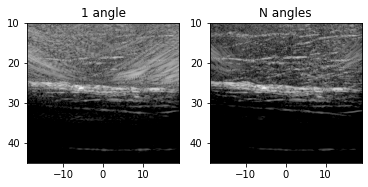

1angle : TSH004.hdf5
Nangle : TSH004.hdf5
1 (2, 356, 387) (2, 356, 387)


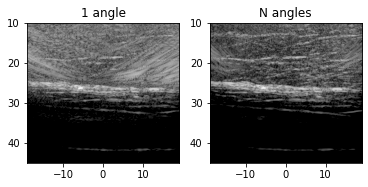

1angle : TSH005.hdf5
Nangle : TSH005.hdf5
2 (2, 356, 387) (2, 356, 387)


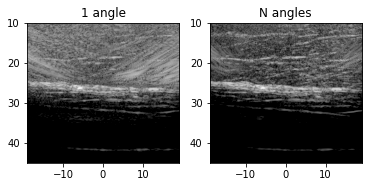

1angle : TSH006.hdf5
Nangle : TSH006.hdf5
3 (2, 356, 387) (2, 356, 387)


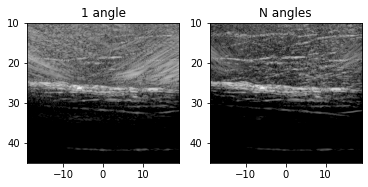

1angle : TSH007.hdf5
Nangle : TSH007.hdf5
4 (2, 356, 387) (2, 356, 387)


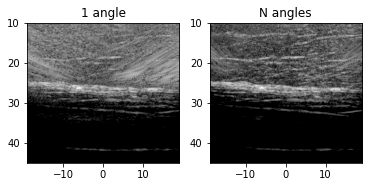

1angle : TSH008.hdf5
Nangle : TSH008.hdf5
5 (2, 356, 387) (2, 356, 387)


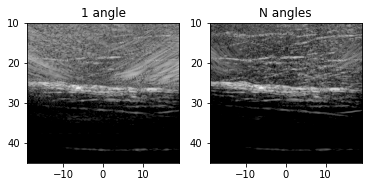

1angle : TSH009.hdf5
Nangle : TSH009.hdf5
6 (2, 356, 387) (2, 356, 387)


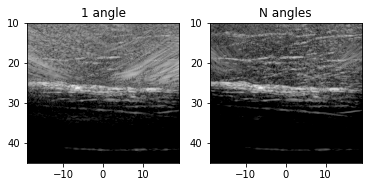

1angle : TSH010.hdf5
Nangle : TSH010.hdf5
7 (2, 356, 387) (2, 356, 387)


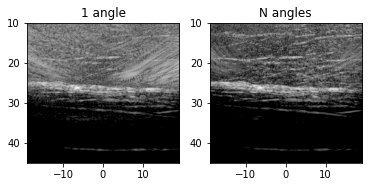

1angle : TSH011.hdf5
Nangle : TSH011.hdf5
8 (2, 356, 387) (2, 356, 387)


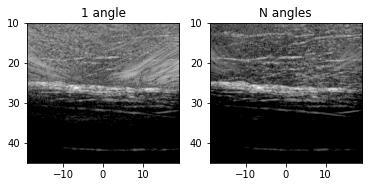

1angle : TSH012.hdf5
Nangle : TSH012.hdf5
9 (2, 356, 387) (2, 356, 387)


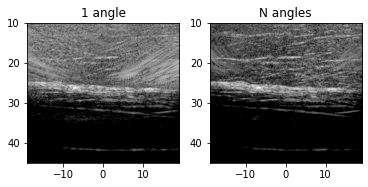

1angle : TSH013.hdf5
Nangle : TSH013.hdf5
10 (2, 356, 387) (2, 356, 387)


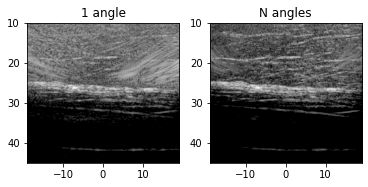

1angle : TSH014.hdf5
Nangle : TSH014.hdf5
11 (2, 356, 387) (2, 356, 387)


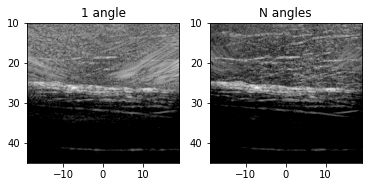

1angle : TSH015.hdf5
Nangle : TSH015.hdf5
12 (2, 356, 387) (2, 356, 387)


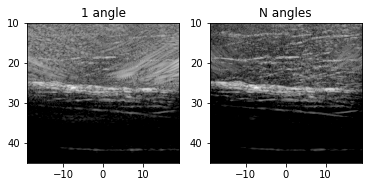

1angle : TSH016.hdf5
Nangle : TSH016.hdf5
13 (2, 356, 387) (2, 356, 387)


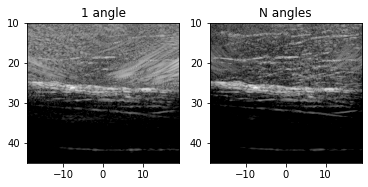

1angle : TSH017.hdf5
Nangle : TSH017.hdf5
14 (2, 356, 387) (2, 356, 387)


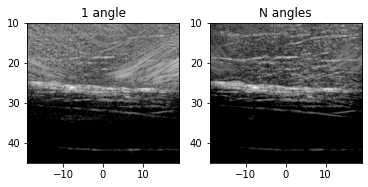

1angle : TSH018.hdf5
Nangle : TSH018.hdf5
15 (2, 356, 387) (2, 356, 387)


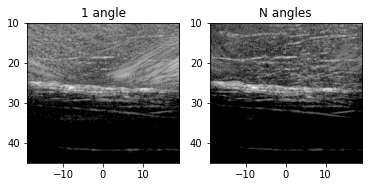

1angle : TSH019.hdf5
Nangle : TSH019.hdf5
16 (2, 356, 387) (2, 356, 387)


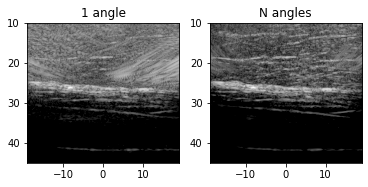

1angle : TSH020.hdf5
Nangle : TSH020.hdf5
17 (2, 356, 387) (2, 356, 387)


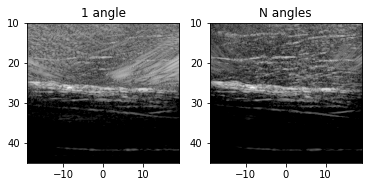

1angle : TSH021.hdf5
Nangle : TSH021.hdf5
18 (2, 356, 387) (2, 356, 387)


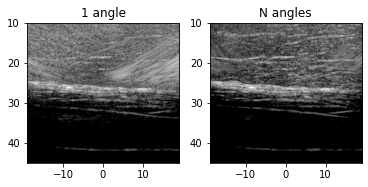

1angle : TSH022.hdf5
Nangle : TSH022.hdf5
19 (2, 356, 387) (2, 356, 387)


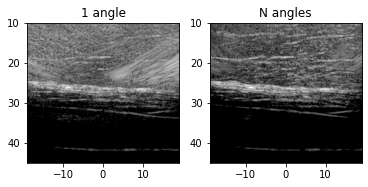

1angle : TSH023.hdf5
Nangle : TSH023.hdf5
20 (2, 356, 387) (2, 356, 387)


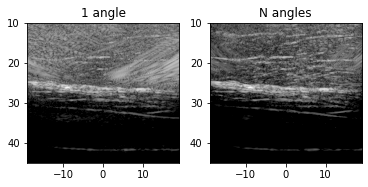

1angle : TSH024.hdf5
Nangle : TSH024.hdf5
21 (2, 356, 387) (2, 356, 387)


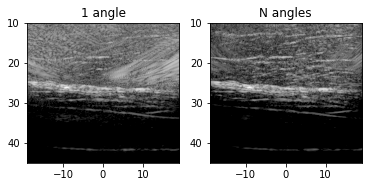

1angle : TSH025.hdf5
Nangle : TSH025.hdf5
22 (2, 356, 387) (2, 356, 387)


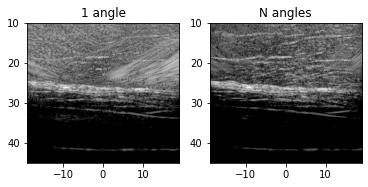

1angle : TSH026.hdf5
Nangle : TSH026.hdf5
23 (2, 356, 387) (2, 356, 387)


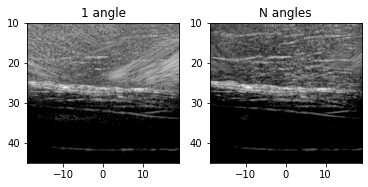

1angle : TSH027.hdf5
Nangle : TSH027.hdf5
24 (2, 356, 387) (2, 356, 387)


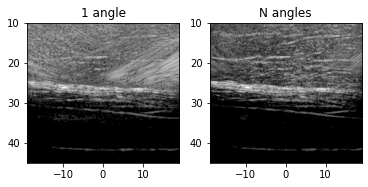

1angle : TSH028.hdf5
Nangle : TSH028.hdf5
25 (2, 356, 387) (2, 356, 387)


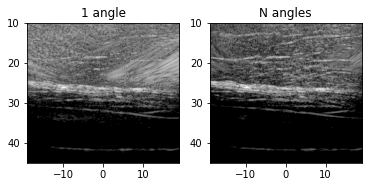

1angle : TSH029.hdf5
Nangle : TSH029.hdf5
26 (2, 356, 387) (2, 356, 387)


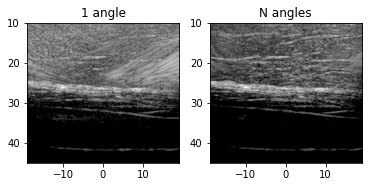

1angle : TSH030.hdf5
Nangle : TSH030.hdf5
27 (2, 356, 387) (2, 356, 387)


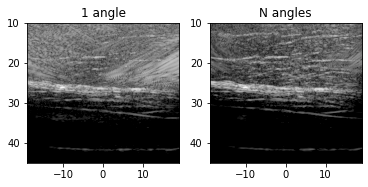

1angle : TSH031.hdf5
Nangle : TSH031.hdf5
28 (2, 356, 387) (2, 356, 387)


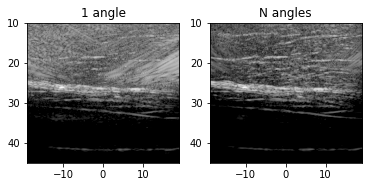

1angle : TSH032.hdf5
Nangle : TSH032.hdf5
29 (2, 356, 387) (2, 356, 387)


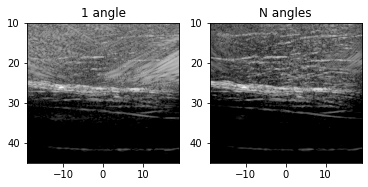

1angle : TSH033.hdf5
Nangle : TSH033.hdf5
30 (2, 356, 387) (2, 356, 387)


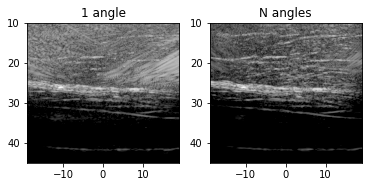

1angle : TSH034.hdf5
Nangle : TSH034.hdf5
31 (2, 356, 387) (2, 356, 387)


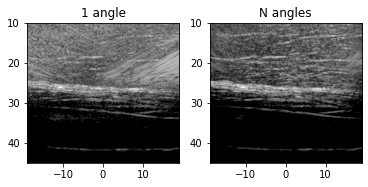

1angle : TSH035.hdf5
Nangle : TSH035.hdf5
32 (2, 356, 387) (2, 356, 387)


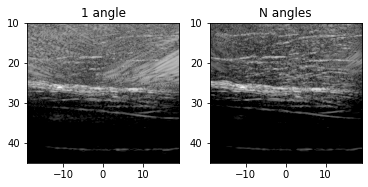

1angle : TSH036.hdf5
Nangle : TSH036.hdf5
33 (2, 356, 387) (2, 356, 387)


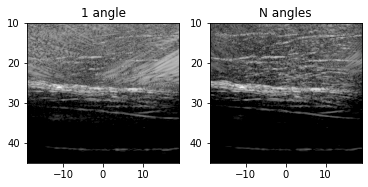

1angle : TSH037.hdf5
Nangle : TSH037.hdf5
34 (2, 356, 387) (2, 356, 387)


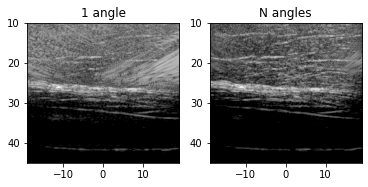

1angle : TSH038.hdf5
Nangle : TSH038.hdf5
35 (2, 356, 387) (2, 356, 387)


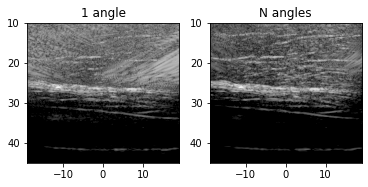

1angle : TSH039.hdf5
Nangle : TSH039.hdf5
36 (2, 356, 387) (2, 356, 387)


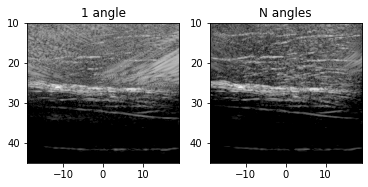

1angle : TSH040.hdf5
Nangle : TSH040.hdf5
37 (2, 356, 387) (2, 356, 387)


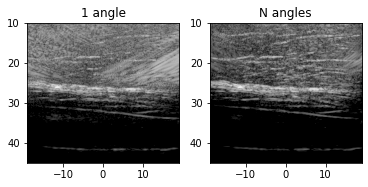

1angle : TSH041.hdf5
Nangle : TSH041.hdf5
38 (2, 356, 387) (2, 356, 387)


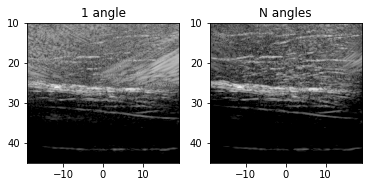

1angle : TSH042.hdf5
Nangle : TSH042.hdf5
39 (2, 356, 387) (2, 356, 387)


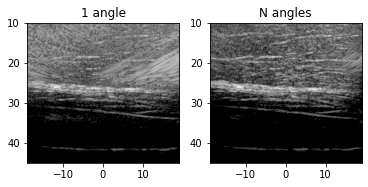

1angle : TSH043.hdf5
Nangle : TSH043.hdf5
40 (2, 356, 387) (2, 356, 387)


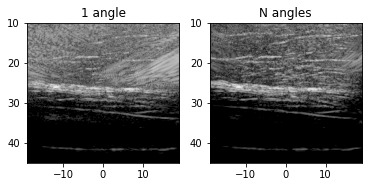

1angle : TSH044.hdf5
Nangle : TSH044.hdf5
41 (2, 356, 387) (2, 356, 387)


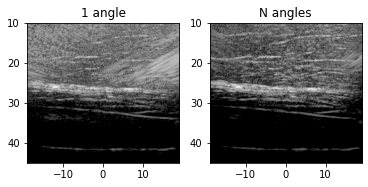

1angle : TSH045.hdf5
Nangle : TSH045.hdf5
42 (2, 356, 387) (2, 356, 387)


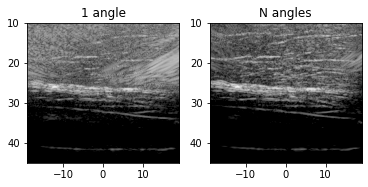

1angle : TSH046.hdf5
Nangle : TSH046.hdf5
43 (2, 356, 387) (2, 356, 387)


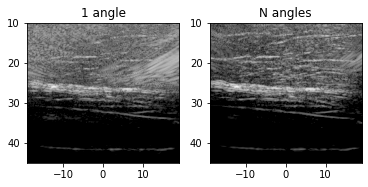

1angle : TSH047.hdf5
Nangle : TSH047.hdf5
44 (2, 356, 387) (2, 356, 387)


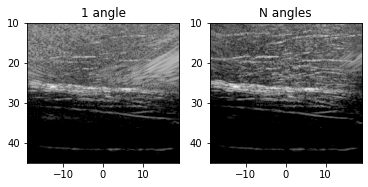

1angle : TSH048.hdf5
Nangle : TSH048.hdf5
45 (2, 356, 387) (2, 356, 387)


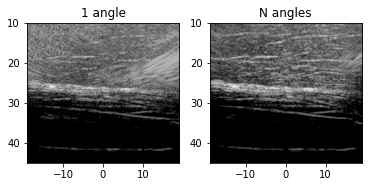

1angle : TSH049.hdf5
Nangle : TSH049.hdf5
46 (2, 356, 387) (2, 356, 387)


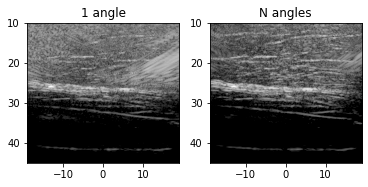

1angle : TSH050.hdf5
Nangle : TSH050.hdf5
47 (2, 356, 387) (2, 356, 387)


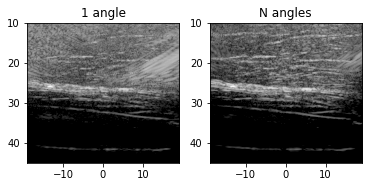

1angle : TSH051.hdf5
Nangle : TSH051.hdf5
48 (2, 356, 387) (2, 356, 387)


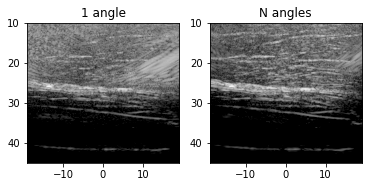

1angle : TSH052.hdf5
Nangle : TSH052.hdf5
49 (2, 356, 387) (2, 356, 387)


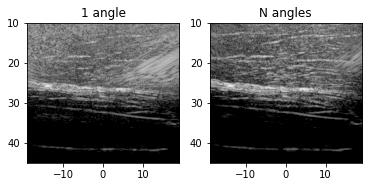

1angle : TSH053.hdf5
Nangle : TSH053.hdf5
50 (2, 356, 387) (2, 356, 387)


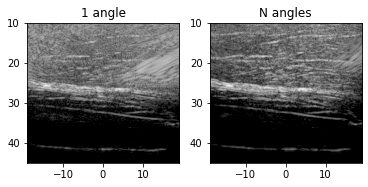

1angle : TSH054.hdf5
Nangle : TSH054.hdf5
51 (2, 356, 387) (2, 356, 387)


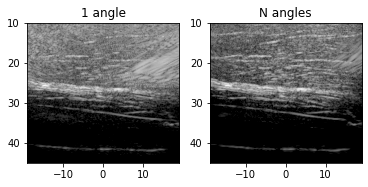

1angle : TSH055.hdf5
Nangle : TSH055.hdf5
52 (2, 356, 387) (2, 356, 387)


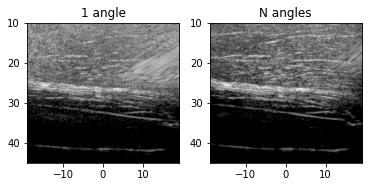

1angle : TSH056.hdf5
Nangle : TSH056.hdf5
53 (2, 356, 387) (2, 356, 387)


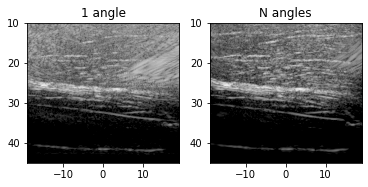

1angle : TSH057.hdf5
Nangle : TSH057.hdf5
54 (2, 356, 387) (2, 356, 387)


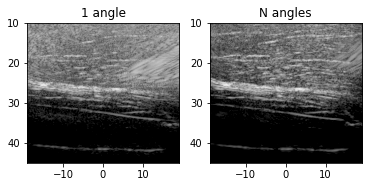

1angle : TSH058.hdf5
Nangle : TSH058.hdf5
55 (2, 356, 387) (2, 356, 387)


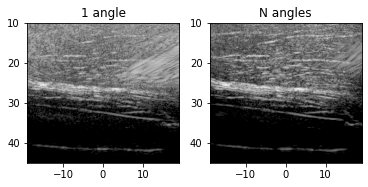

1angle : TSH059.hdf5
Nangle : TSH059.hdf5
56 (2, 356, 387) (2, 356, 387)


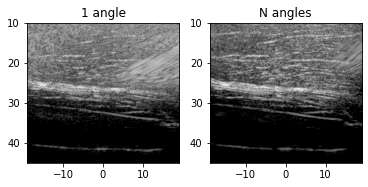

1angle : TSH060.hdf5
Nangle : TSH060.hdf5
57 (2, 356, 387) (2, 356, 387)


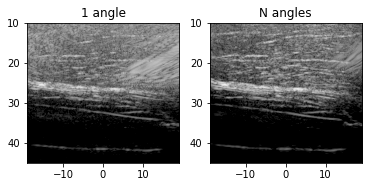

1angle : TSH061.hdf5
Nangle : TSH061.hdf5
58 (2, 356, 387) (2, 356, 387)


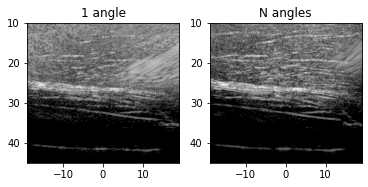

1angle : TSH062.hdf5
Nangle : TSH062.hdf5
59 (2, 356, 387) (2, 356, 387)


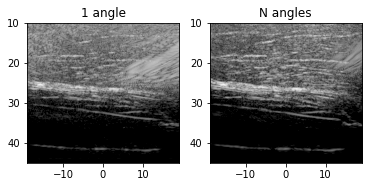

1angle : TSH063.hdf5
Nangle : TSH063.hdf5
60 (2, 356, 387) (2, 356, 387)


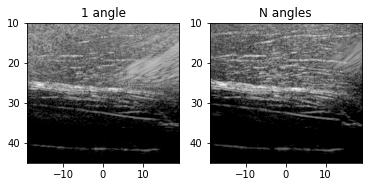

1angle : TSH064.hdf5
Nangle : TSH064.hdf5
61 (2, 356, 387) (2, 356, 387)


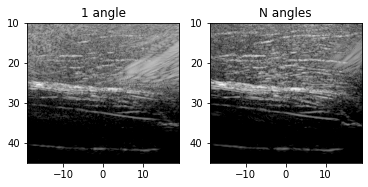

1angle : TSH065.hdf5
Nangle : TSH065.hdf5
62 (2, 356, 387) (2, 356, 387)


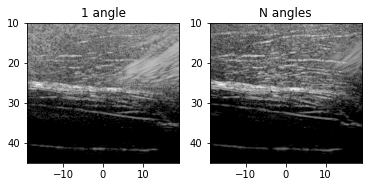

1angle : TSH066.hdf5
Nangle : TSH066.hdf5
63 (2, 356, 387) (2, 356, 387)


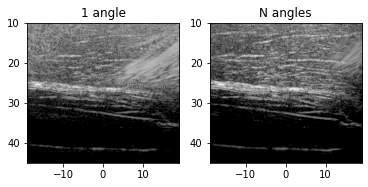

1angle : TSH067.hdf5
Nangle : TSH067.hdf5
64 (2, 356, 387) (2, 356, 387)


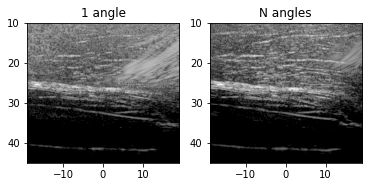

1angle : TSH068.hdf5
Nangle : TSH068.hdf5
65 (2, 356, 387) (2, 356, 387)


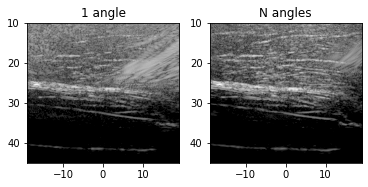

1angle : TSH069.hdf5
Nangle : TSH069.hdf5
66 (2, 356, 387) (2, 356, 387)


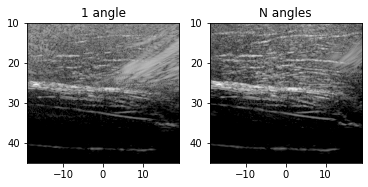

1angle : TSH070.hdf5
Nangle : TSH070.hdf5
67 (2, 356, 387) (2, 356, 387)


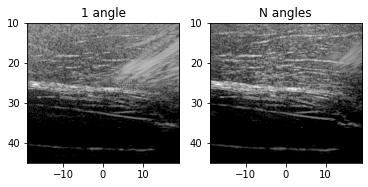

1angle : TSH071.hdf5
Nangle : TSH071.hdf5
68 (2, 356, 387) (2, 356, 387)


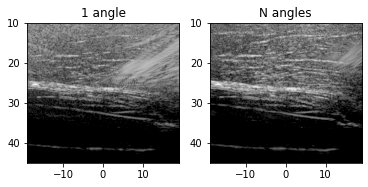

1angle : TSH072.hdf5
Nangle : TSH072.hdf5
69 (2, 356, 387) (2, 356, 387)


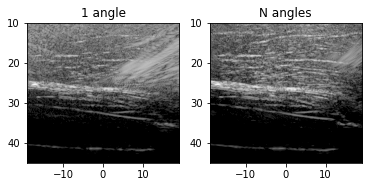

1angle : TSH073.hdf5
Nangle : TSH073.hdf5
70 (2, 356, 387) (2, 356, 387)


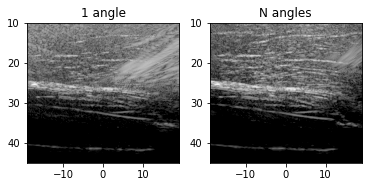

1angle : TSH074.hdf5
Nangle : TSH074.hdf5
71 (2, 356, 387) (2, 356, 387)


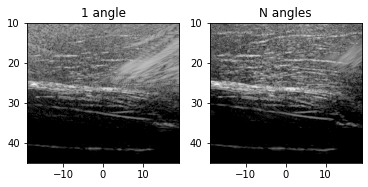

1angle : TSH075.hdf5
Nangle : TSH075.hdf5
72 (2, 356, 387) (2, 356, 387)


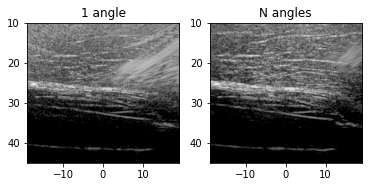

1angle : TSH076.hdf5
Nangle : TSH076.hdf5
73 (2, 356, 387) (2, 356, 387)


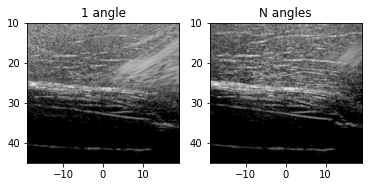

1angle : TSH077.hdf5
Nangle : TSH077.hdf5
74 (2, 356, 387) (2, 356, 387)


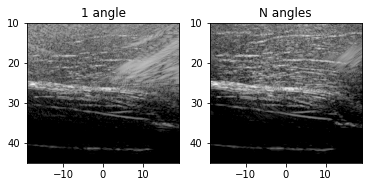

1angle : TSH078.hdf5
Nangle : TSH078.hdf5
75 (2, 356, 387) (2, 356, 387)


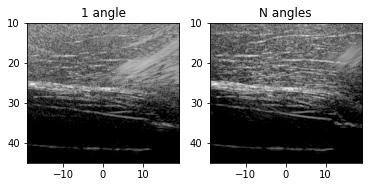

1angle : TSH079.hdf5
Nangle : TSH079.hdf5
76 (2, 356, 387) (2, 356, 387)


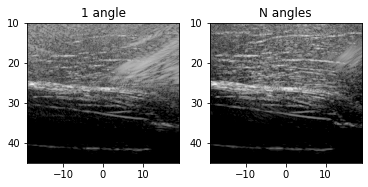

1angle : TSH080.hdf5
Nangle : TSH080.hdf5
77 (2, 356, 387) (2, 356, 387)


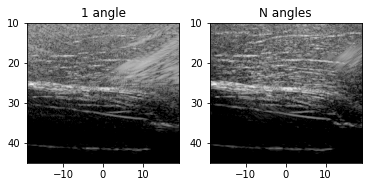

1angle : TSH081.hdf5
Nangle : TSH081.hdf5
78 (2, 356, 387) (2, 356, 387)


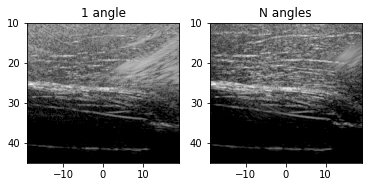

1angle : TSH082.hdf5
Nangle : TSH082.hdf5
79 (2, 356, 387) (2, 356, 387)


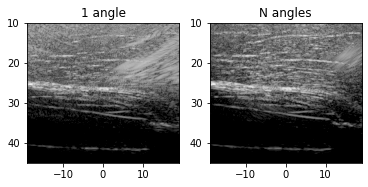

1angle : TSH083.hdf5
Nangle : TSH083.hdf5
80 (2, 356, 387) (2, 356, 387)


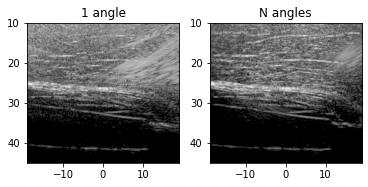

1angle : TSH084.hdf5
Nangle : TSH084.hdf5
81 (2, 356, 387) (2, 356, 387)


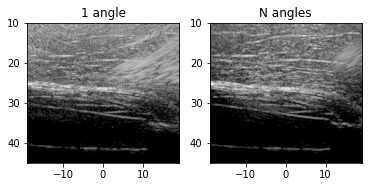

1angle : TSH085.hdf5
Nangle : TSH085.hdf5
82 (2, 356, 387) (2, 356, 387)


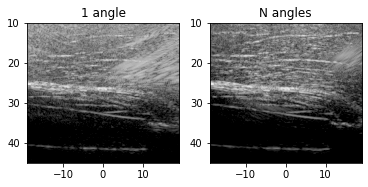

1angle : TSH086.hdf5
Nangle : TSH086.hdf5
83 (2, 356, 387) (2, 356, 387)


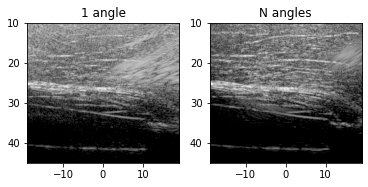

1angle : TSH087.hdf5
Nangle : TSH087.hdf5
84 (2, 356, 387) (2, 356, 387)


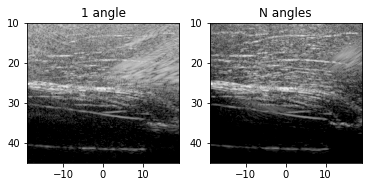

1angle : TSH088.hdf5
Nangle : TSH088.hdf5
85 (2, 356, 387) (2, 356, 387)


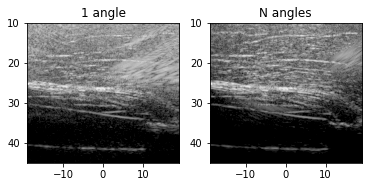

1angle : TSH089.hdf5
Nangle : TSH089.hdf5
86 (2, 356, 387) (2, 356, 387)


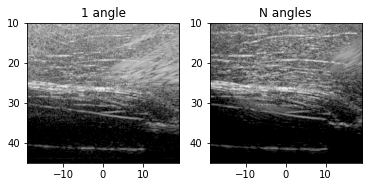

1angle : TSH090.hdf5
Nangle : TSH090.hdf5
87 (2, 356, 387) (2, 356, 387)


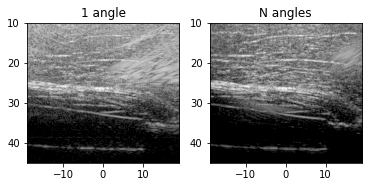

1angle : TSH091.hdf5
Nangle : TSH091.hdf5
88 (2, 356, 387) (2, 356, 387)


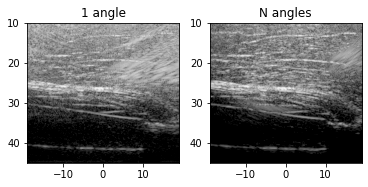

1angle : TSH092.hdf5
Nangle : TSH092.hdf5
89 (2, 356, 387) (2, 356, 387)


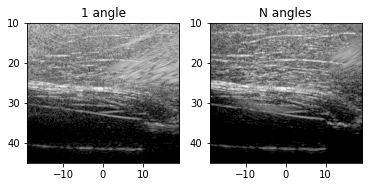

1angle : TSH093.hdf5
Nangle : TSH093.hdf5
90 (2, 356, 387) (2, 356, 387)


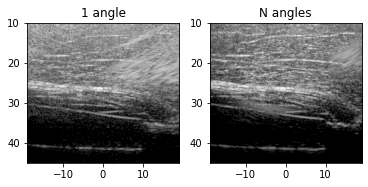

1angle : TSH094.hdf5
Nangle : TSH094.hdf5
91 (2, 356, 387) (2, 356, 387)


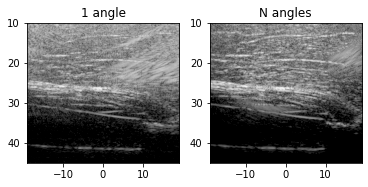

1angle : TSH095.hdf5
Nangle : TSH095.hdf5
92 (2, 356, 387) (2, 356, 387)


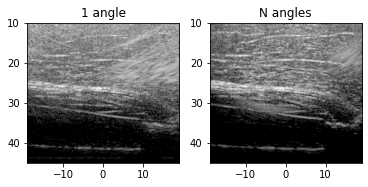

1angle : TSH096.hdf5
Nangle : TSH096.hdf5
93 (2, 356, 387) (2, 356, 387)


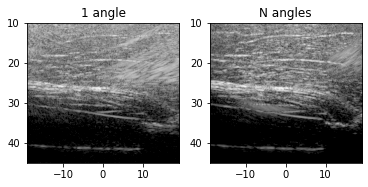

1angle : TSH097.hdf5
Nangle : TSH097.hdf5
94 (2, 356, 387) (2, 356, 387)


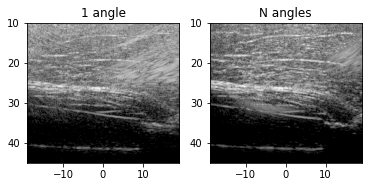

1angle : TSH098.hdf5
Nangle : TSH098.hdf5
95 (2, 356, 387) (2, 356, 387)


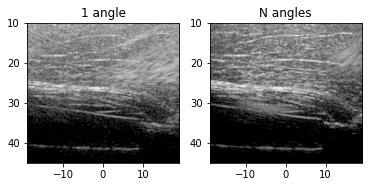

1angle : TSH099.hdf5
Nangle : TSH099.hdf5
96 (2, 356, 387) (2, 356, 387)


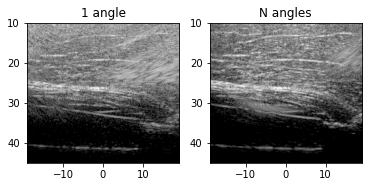

1angle : TSH100.hdf5
Nangle : TSH100.hdf5
97 (2, 356, 387) (2, 356, 387)


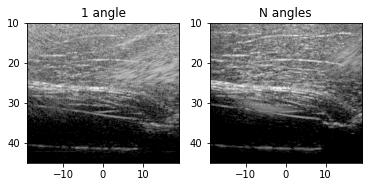

1angle : TSH101.hdf5
Nangle : TSH101.hdf5
98 (2, 356, 387) (2, 356, 387)


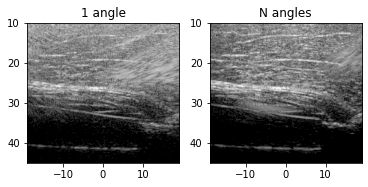

1angle : TSH102.hdf5
Nangle : TSH102.hdf5
99 (2, 356, 387) (2, 356, 387)


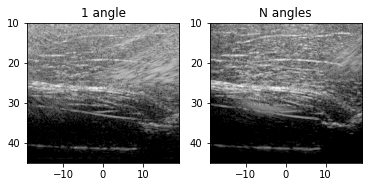

1angle : TSH103.hdf5
Nangle : TSH103.hdf5
100 (2, 356, 387) (2, 356, 387)


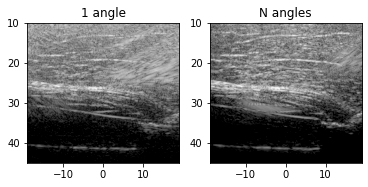

1angle : TSH104.hdf5
Nangle : TSH104.hdf5
101 (2, 356, 387) (2, 356, 387)


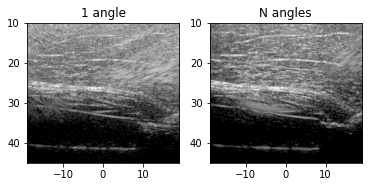

1angle : TSH105.hdf5
Nangle : TSH105.hdf5
102 (2, 356, 387) (2, 356, 387)


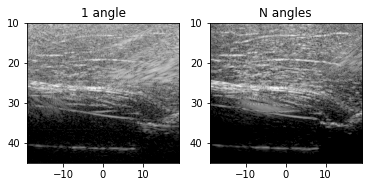

1angle : TSH106.hdf5
Nangle : TSH106.hdf5
103 (2, 356, 387) (2, 356, 387)


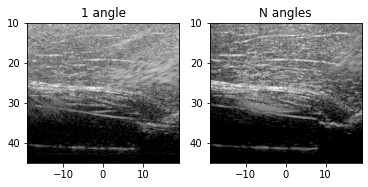

1angle : TSH107.hdf5
Nangle : TSH107.hdf5
104 (2, 356, 387) (2, 356, 387)


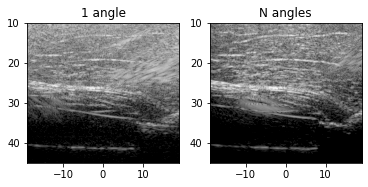

1angle : TSH108.hdf5
Nangle : TSH108.hdf5
105 (2, 356, 387) (2, 356, 387)


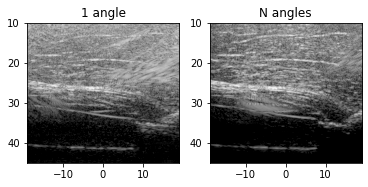

1angle : TSH109.hdf5
Nangle : TSH109.hdf5
106 (2, 356, 387) (2, 356, 387)


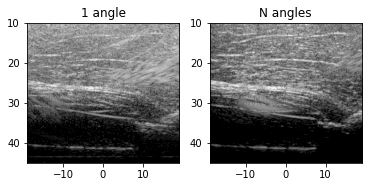

1angle : TSH110.hdf5
Nangle : TSH110.hdf5
107 (2, 356, 387) (2, 356, 387)


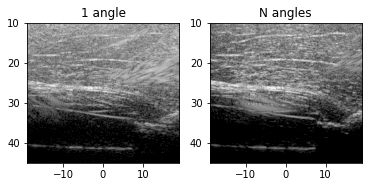

1angle : TSH111.hdf5
Nangle : TSH111.hdf5
108 (2, 356, 387) (2, 356, 387)


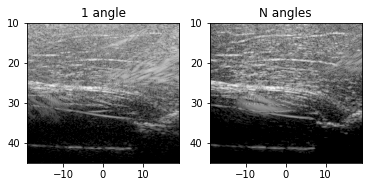

1angle : TSH112.hdf5
Nangle : TSH112.hdf5
109 (2, 356, 387) (2, 356, 387)


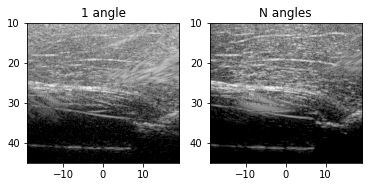

1angle : TSH113.hdf5
Nangle : TSH113.hdf5
110 (2, 356, 387) (2, 356, 387)


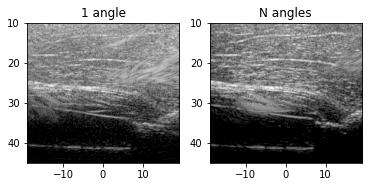

1angle : TSH114.hdf5
Nangle : TSH114.hdf5
111 (2, 356, 387) (2, 356, 387)


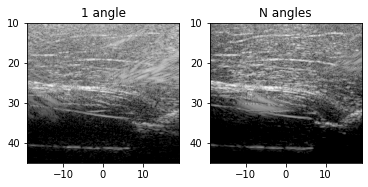

1angle : TSH115.hdf5
Nangle : TSH115.hdf5
112 (2, 356, 387) (2, 356, 387)


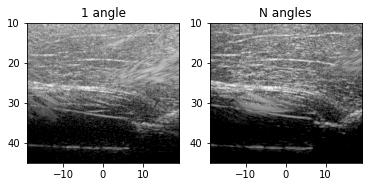

1angle : TSH116.hdf5
Nangle : TSH116.hdf5
113 (2, 356, 387) (2, 356, 387)


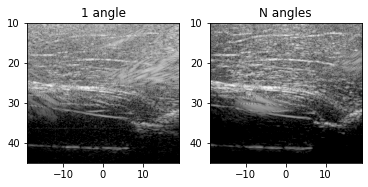

1angle : TSH117.hdf5
Nangle : TSH117.hdf5
114 (2, 356, 387) (2, 356, 387)


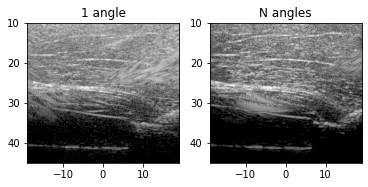

1angle : TSH118.hdf5
Nangle : TSH118.hdf5
115 (2, 356, 387) (2, 356, 387)


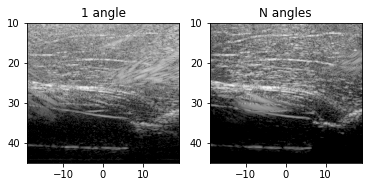

1angle : TSH119.hdf5
Nangle : TSH119.hdf5
116 (2, 356, 387) (2, 356, 387)


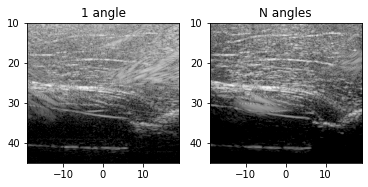

1angle : TSH120.hdf5
Nangle : TSH120.hdf5
117 (2, 356, 387) (2, 356, 387)


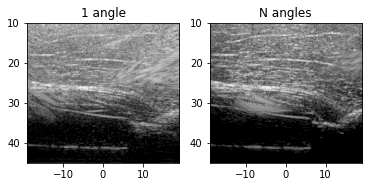

1angle : TSH121.hdf5
Nangle : TSH121.hdf5
118 (2, 356, 387) (2, 356, 387)


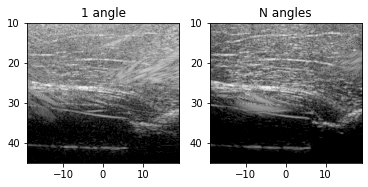

1angle : TSH122.hdf5
Nangle : TSH122.hdf5
119 (2, 356, 387) (2, 356, 387)


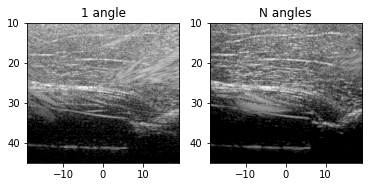

1angle : TSH123.hdf5
Nangle : TSH123.hdf5
120 (2, 356, 387) (2, 356, 387)


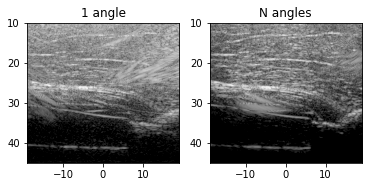

1angle : TSH124.hdf5
Nangle : TSH124.hdf5
121 (2, 356, 387) (2, 356, 387)


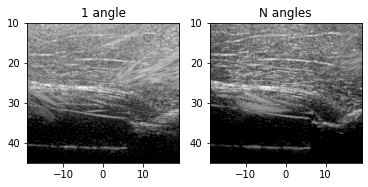

1angle : TSH125.hdf5
Nangle : TSH125.hdf5
122 (2, 356, 387) (2, 356, 387)


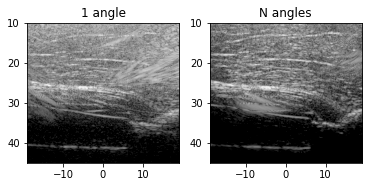

1angle : TSH126.hdf5
Nangle : TSH126.hdf5
123 (2, 356, 387) (2, 356, 387)


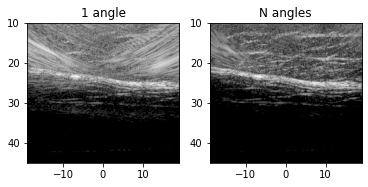

1angle : TSH127.hdf5
Nangle : TSH127.hdf5
124 (2, 356, 387) (2, 356, 387)


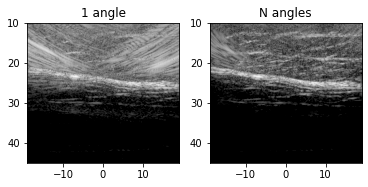

1angle : TSH128.hdf5
Nangle : TSH128.hdf5
125 (2, 356, 387) (2, 356, 387)


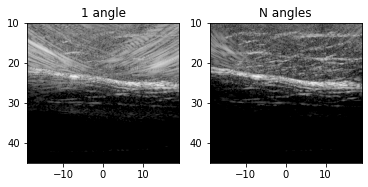

1angle : TSH129.hdf5
Nangle : TSH129.hdf5
126 (2, 356, 387) (2, 356, 387)


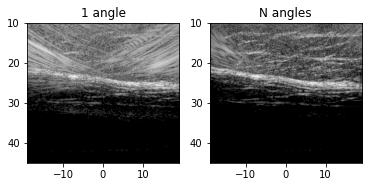

1angle : TSH130.hdf5
Nangle : TSH130.hdf5
127 (2, 356, 387) (2, 356, 387)


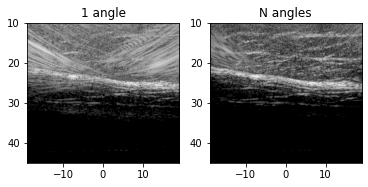

1angle : TSH131.hdf5
Nangle : TSH131.hdf5
128 (2, 356, 387) (2, 356, 387)


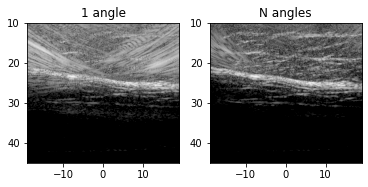

1angle : TSH132.hdf5
Nangle : TSH132.hdf5
129 (2, 356, 387) (2, 356, 387)


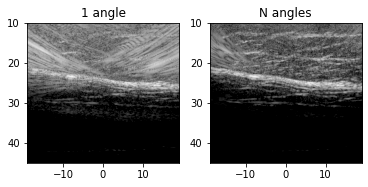

1angle : TSH133.hdf5
Nangle : TSH133.hdf5
130 (2, 356, 387) (2, 356, 387)


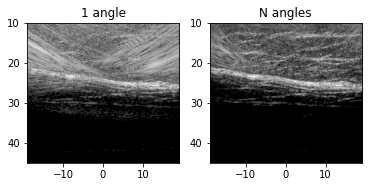

1angle : TSH134.hdf5
Nangle : TSH134.hdf5
131 (2, 356, 387) (2, 356, 387)


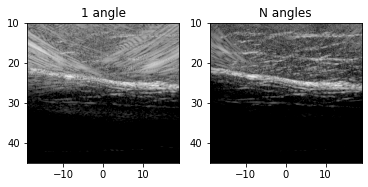

1angle : TSH135.hdf5
Nangle : TSH135.hdf5
132 (2, 356, 387) (2, 356, 387)


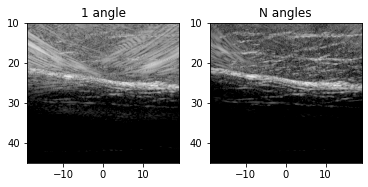

1angle : TSH136.hdf5
Nangle : TSH136.hdf5
133 (2, 356, 387) (2, 356, 387)


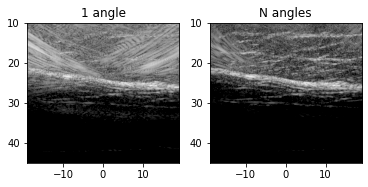

1angle : TSH137.hdf5
Nangle : TSH137.hdf5
134 (2, 356, 387) (2, 356, 387)


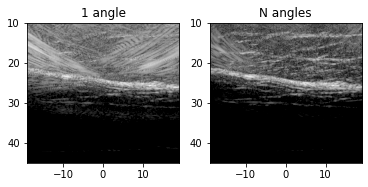

1angle : TSH138.hdf5
Nangle : TSH138.hdf5
135 (2, 356, 387) (2, 356, 387)


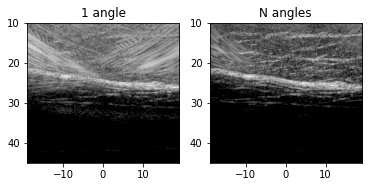

1angle : TSH139.hdf5
Nangle : TSH139.hdf5
136 (2, 356, 387) (2, 356, 387)


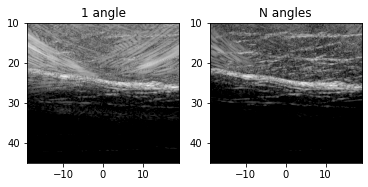

1angle : TSH140.hdf5
Nangle : TSH140.hdf5
137 (2, 356, 387) (2, 356, 387)


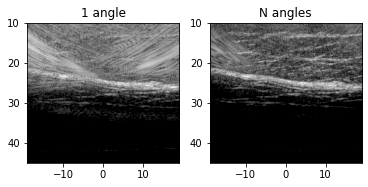

1angle : TSH141.hdf5
Nangle : TSH141.hdf5
138 (2, 356, 387) (2, 356, 387)


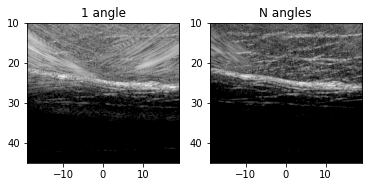

1angle : TSH142.hdf5
Nangle : TSH142.hdf5
139 (2, 356, 387) (2, 356, 387)


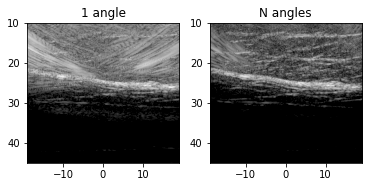

1angle : TSH143.hdf5
Nangle : TSH143.hdf5
140 (2, 356, 387) (2, 356, 387)


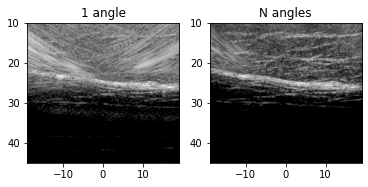

1angle : TSH144.hdf5
Nangle : TSH144.hdf5
141 (2, 356, 387) (2, 356, 387)


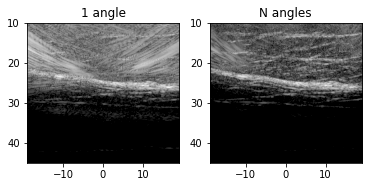

1angle : TSH145.hdf5
Nangle : TSH145.hdf5
142 (2, 356, 387) (2, 356, 387)


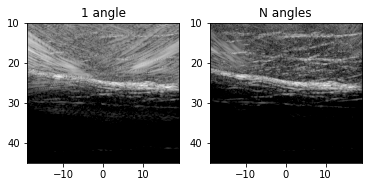

1angle : TSH146.hdf5
Nangle : TSH146.hdf5
143 (2, 356, 387) (2, 356, 387)


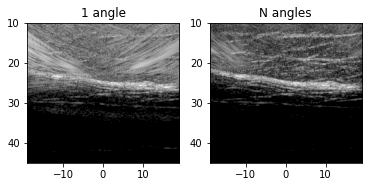

1angle : TSH147.hdf5
Nangle : TSH147.hdf5
144 (2, 356, 387) (2, 356, 387)


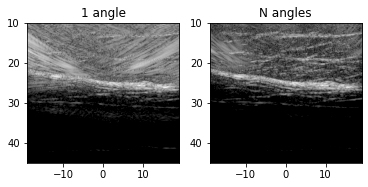

1angle : TSH148.hdf5
Nangle : TSH148.hdf5
145 (2, 356, 387) (2, 356, 387)


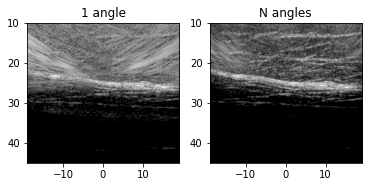

1angle : TSH149.hdf5
Nangle : TSH149.hdf5
146 (2, 356, 387) (2, 356, 387)


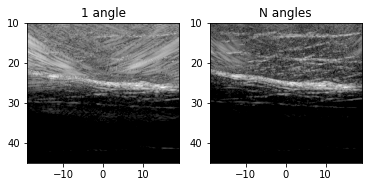

1angle : TSH150.hdf5
Nangle : TSH150.hdf5
147 (2, 356, 387) (2, 356, 387)


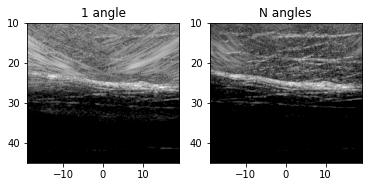

1angle : TSH151.hdf5
Nangle : TSH151.hdf5
148 (2, 356, 387) (2, 356, 387)


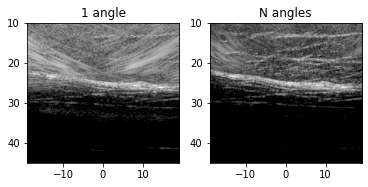

1angle : TSH152.hdf5
Nangle : TSH152.hdf5
149 (2, 356, 387) (2, 356, 387)


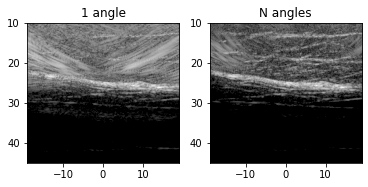

1angle : TSH153.hdf5
Nangle : TSH153.hdf5
150 (2, 356, 387) (2, 356, 387)


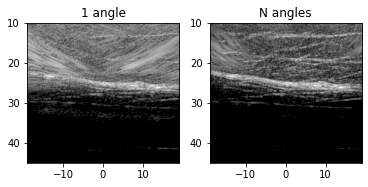

1angle : TSH154.hdf5
Nangle : TSH154.hdf5
151 (2, 356, 387) (2, 356, 387)


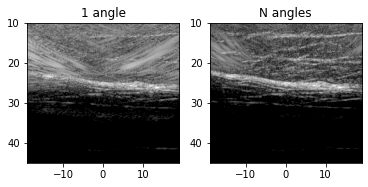

1angle : TSH155.hdf5
Nangle : TSH155.hdf5
152 (2, 356, 387) (2, 356, 387)


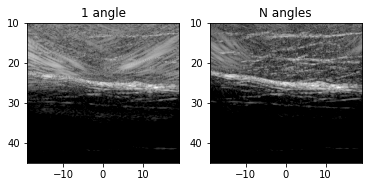

1angle : TSH156.hdf5
Nangle : TSH156.hdf5
153 (2, 356, 387) (2, 356, 387)


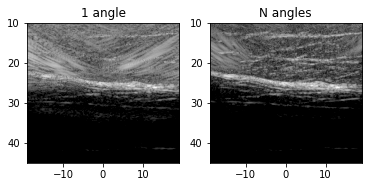

1angle : TSH157.hdf5
Nangle : TSH157.hdf5
154 (2, 356, 387) (2, 356, 387)


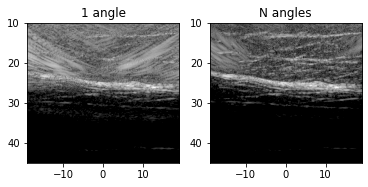

1angle : TSH158.hdf5
Nangle : TSH158.hdf5
155 (2, 356, 387) (2, 356, 387)


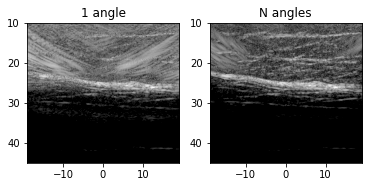

1angle : TSH159.hdf5
Nangle : TSH159.hdf5
156 (2, 356, 387) (2, 356, 387)


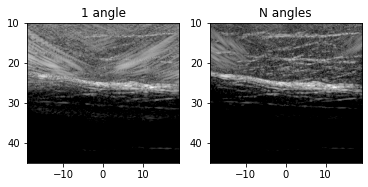

1angle : TSH160.hdf5
Nangle : TSH160.hdf5
157 (2, 356, 387) (2, 356, 387)


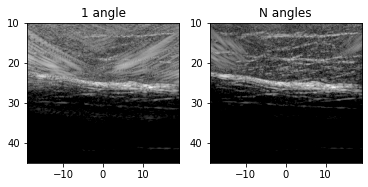

1angle : TSH161.hdf5
Nangle : TSH161.hdf5
158 (2, 356, 387) (2, 356, 387)


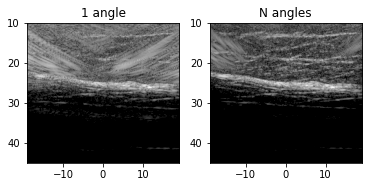

1angle : TSH162.hdf5
Nangle : TSH162.hdf5
159 (2, 356, 387) (2, 356, 387)


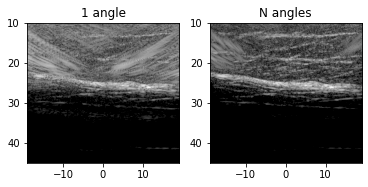

1angle : TSH163.hdf5
Nangle : TSH163.hdf5
160 (2, 356, 387) (2, 356, 387)


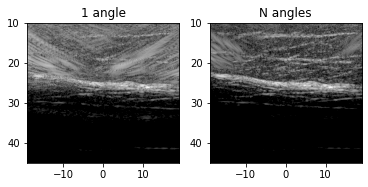

1angle : TSH164.hdf5
Nangle : TSH164.hdf5
161 (2, 356, 387) (2, 356, 387)


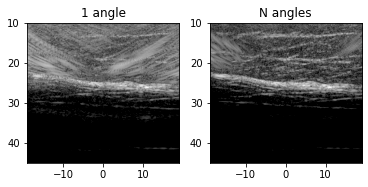

1angle : TSH165.hdf5
Nangle : TSH165.hdf5
162 (2, 356, 387) (2, 356, 387)


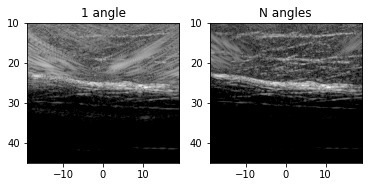

1angle : TSH166.hdf5
Nangle : TSH166.hdf5
163 (2, 356, 387) (2, 356, 387)


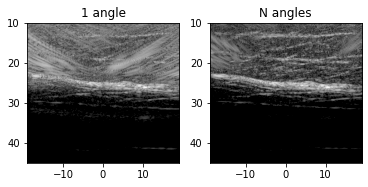

1angle : TSH167.hdf5
Nangle : TSH167.hdf5
164 (2, 356, 387) (2, 356, 387)


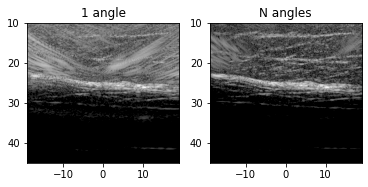

1angle : TSH168.hdf5
Nangle : TSH168.hdf5
165 (2, 356, 387) (2, 356, 387)


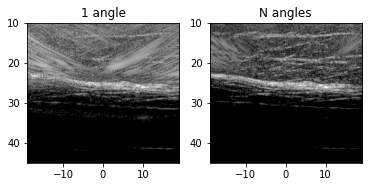

1angle : TSH169.hdf5
Nangle : TSH169.hdf5
166 (2, 356, 387) (2, 356, 387)


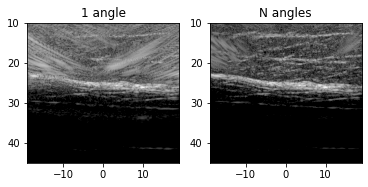

1angle : TSH170.hdf5
Nangle : TSH170.hdf5
167 (2, 356, 387) (2, 356, 387)


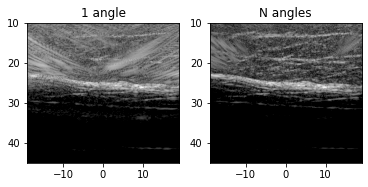

1angle : TSH171.hdf5
Nangle : TSH171.hdf5
168 (2, 356, 387) (2, 356, 387)


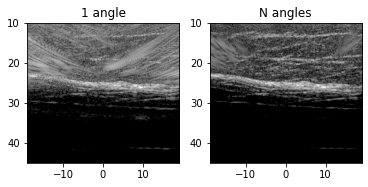

1angle : TSH172.hdf5
Nangle : TSH172.hdf5
169 (2, 356, 387) (2, 356, 387)


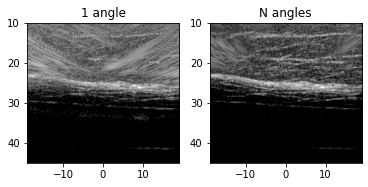

1angle : TSH173.hdf5
Nangle : TSH173.hdf5
170 (2, 356, 387) (2, 356, 387)


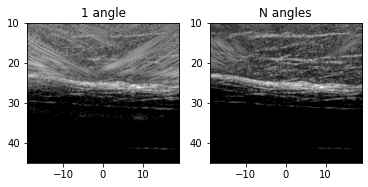

1angle : TSH174.hdf5
Nangle : TSH174.hdf5
171 (2, 356, 387) (2, 356, 387)


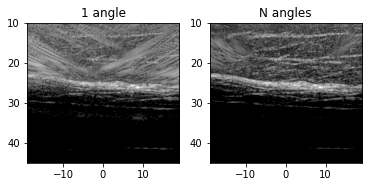

1angle : TSH175.hdf5
Nangle : TSH175.hdf5
172 (2, 356, 387) (2, 356, 387)


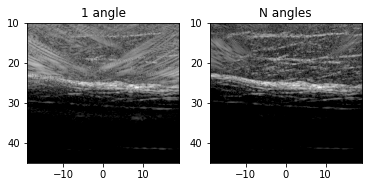

1angle : TSH176.hdf5
Nangle : TSH176.hdf5
173 (2, 356, 387) (2, 356, 387)


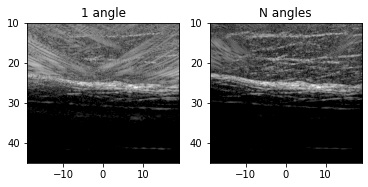

1angle : TSH177.hdf5
Nangle : TSH177.hdf5
174 (2, 356, 387) (2, 356, 387)


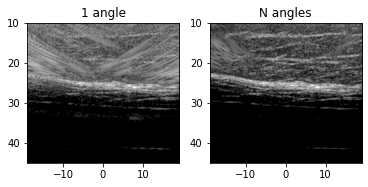

1angle : TSH178.hdf5
Nangle : TSH178.hdf5
175 (2, 356, 387) (2, 356, 387)


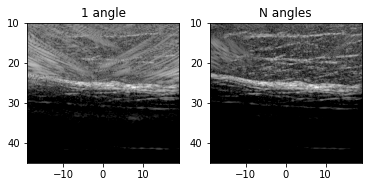

1angle : TSH179.hdf5
Nangle : TSH179.hdf5
176 (2, 356, 387) (2, 356, 387)


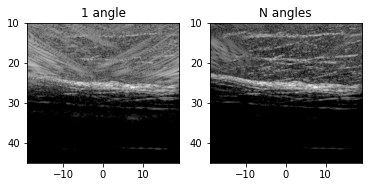

1angle : TSH180.hdf5
Nangle : TSH180.hdf5
177 (2, 356, 387) (2, 356, 387)


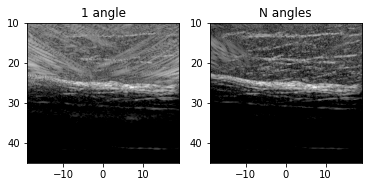

1angle : TSH181.hdf5
Nangle : TSH181.hdf5
178 (2, 356, 387) (2, 356, 387)


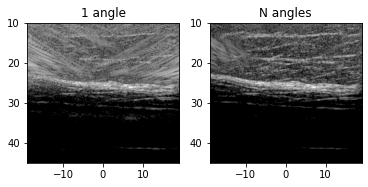

1angle : TSH182.hdf5
Nangle : TSH182.hdf5
179 (2, 356, 387) (2, 356, 387)


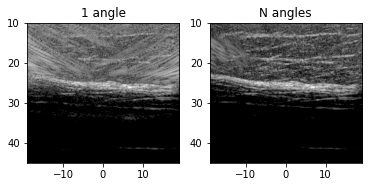

1angle : TSH183.hdf5
Nangle : TSH183.hdf5
180 (2, 356, 387) (2, 356, 387)


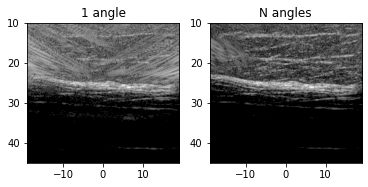

1angle : TSH184.hdf5
Nangle : TSH184.hdf5


KeyboardInterrupt: 

In [47]:
US_dataset = USDataset(root_dir = r'D:\OneDrive\Documents\Maestria_Biomedica\Imagenes_Medicas\model_cubdl\TSH')
for i in range(len(US_dataset)):
    sample = US_dataset[i]
    print(i, sample['us_1angle'].shape, sample['us_Nangle'].shape)

    idas1, qdas1 = sample['us_1angle']
    idasN, qdasN = sample['us_Nangle']

    iq1 = idas1 + 1j * qdas1
    bimg1 = 20 * np.log10(np.abs(iq1))  # Log-compress
    bimg1 -= np.amax(bimg1)  # Normalize by max value

    iqN = idasN + 1j * qdasN
    bimgN = 20 * np.log10(np.abs(iqN))  # Log-compress
    bimgN -= np.amax(bimgN)  # Normalize by max value

    # Display images via matplotlib
    xlims = [-0.019049999999999997, 0.019049999999999997]
    zlims = [10e-3, 45e-3]
    
    extent = [xlims[0] * 1e3, xlims[1] * 1e3, zlims[1] * 1e3, zlims[0] * 1e3]
    plt.clf()
    plt.subplot(121)
    plt.imshow(bimg1, vmin=-60, cmap="gray", extent=extent, origin="upper")
    plt.title("1 angle")
    plt.subplot(122)
    plt.imshow(bimgN, vmin=-60, cmap="gray", extent=extent, origin="upper")
    plt.title("N angles")
    plt.pause(0.01)